In [ ]:
# Install the correct OpenCV packages. This is all you need.
!pip install opencv-python opencv-contrib-python

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

folder_path = "/content/drive/MyDrive/crop_img_final"

# List all files
files = os.listdir(folder_path)
print("Files:", files)

# Count them
print("Total files:", len(files))


Files: ['corn', 'mustard', 'black gram', 'groundnut', 'wheat', 'chickpea', 'soyabean', 'pegeon pea', 'millets']
Total files: 9


In [ ]:
# -----------------------------
# CELL 1: SETUP & CONFIGURATION
# -----------------------------

# --- Install necessary packages ---
!pip install opencv-python opencv-contrib-python tqdm

# --- Import all required libraries ---
import os
import shutil
import time
from pathlib import Path
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.models as models

print("✅ Step 1: Setup and Configuration Complete. Libraries are installed and imported.")

# --- Main Configuration Block ---

# --- Data Path Configuration ---
# Your ONLY starting point: put class folders in here
SOURCE_DATA_DIR = Path("/content/drive/MyDrive/crop_img_final")
# The script will create these directories
OUTPUT_RAW_DATA_DIR = Path("raw_data")
PROCESSED_DATA_DIR = Path("processed_data")


# --- Data Splitting Configuration ---
TRAIN_RATIO = 0.70
VAL_RATIO = 0.15
TEST_RATIO = 0.15 # Should sum to 1.0

# --- Preprocessing Configuration ---
IMG_SIZE = (224, 224)
SIFT_STRIDE = 8
SIFT_KEYPOINT_SIZE = 16

# --- Training Configuration (T4 GPU Optimized) ---
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 1e-4
BATCH_SIZE = 32
NUM_EPOCHS = 50
PIN_MEMORY = True # Speeds up data transfer to the GPU
NUM_WORKERS = 2   # Standard for Colab environments

✅ Step 1: Setup and Configuration Complete. Libraries are installed and imported.


In [ ]:
# ---------------------------------------------
# CELL 2: DATA PREPARATION FUNCTION DEFINITIONS
# ---------------------------------------------

def split_data():
    """Splits the source images into train, val, and test sets."""
    print("\nPHASE 1: Checking and splitting data...")
    if OUTPUT_RAW_DATA_DIR.exists():
        print(" -> 'raw_data' directory already exists. Skipping split.")
        return

    print(f" -> Creating splits from '{SOURCE_DATA_DIR}'...")
    OUTPUT_RAW_DATA_DIR.mkdir(exist_ok=True)
    all_files, labels = [], []
    class_names = [d.name for d in SOURCE_DATA_DIR.iterdir() if d.is_dir()]

    for class_name in class_names:
        class_dir = SOURCE_DATA_DIR / class_name
        files_in_class = list(class_dir.glob("*"))
        all_files.extend(files_in_class)
        labels.extend([class_name] * len(files_in_class))

    train_files, val_test_files, train_labels, val_test_labels = train_test_split(
        all_files, labels, test_size=(1 - TRAIN_RATIO), random_state=42, stratify=labels
    )
    relative_test_ratio = TEST_RATIO / (VAL_RATIO + TEST_RATIO)
    val_files, test_files, _, _ = train_test_split(
        val_test_files, val_test_labels, test_size=relative_test_ratio, random_state=42, stratify=val_test_labels
    )

    def copy_files(files, split_name):
        for file_path in files:
            class_name = file_path.parent.name
            destination_dir = OUTPUT_RAW_DATA_DIR / split_name / class_name
            destination_dir.mkdir(parents=True, exist_ok=True)
            shutil.copy(file_path, destination_dir)

    copy_files(train_files, "train")
    copy_files(val_files, "val")
    copy_files(test_files, "test")
    print(" -> Data splitting complete.")


def preprocess_data():
    """Runs SIFT extraction on the split data."""
    print("\nPHASE 2: Checking and preprocessing data...")
    if PROCESSED_DATA_DIR.exists():
        print(" -> 'processed_data' directory already exists. Skipping preprocessing.")
        return

    print(f" -> Creating preprocessed data in '{PROCESSED_DATA_DIR}'...")
    sift = cv2.SIFT_create()

    def extract_dense_sift_opencv(image):
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        keypoints = [cv2.KeyPoint(x, y, SIFT_KEYPOINT_SIZE)
                     for y in range(0, gray_image.shape[0], SIFT_STRIDE)
                     for x in range(0, gray_image.shape[1], SIFT_STRIDE)]
        _, descriptors = sift.compute(gray_image, keypoints)
        if descriptors is None: return None

        h = (gray_image.shape[0] // SIFT_STRIDE)
        w = (gray_image.shape[1] // SIFT_STRIDE)

        # Check for edge cases where not all keypoints are valid
        if descriptors.shape[0] != len(keypoints):
             print(f"Warning: Mismatch in descriptors ({descriptors.shape[0]}) vs keypoints ({len(keypoints)}). Skipping file.")
             return None
        return descriptors.reshape(h, w, 128)

    image_paths = list(OUTPUT_RAW_DATA_DIR.glob("**/*.*"))
    for img_path in tqdm(image_paths, desc="Preprocessing Images"):
        try:
            relative_path = img_path.relative_to(OUTPUT_RAW_DATA_DIR)
            save_dir = PROCESSED_DATA_DIR / relative_path.parent
            save_dir.mkdir(parents=True, exist_ok=True)

            img = cv2.imread(str(img_path))
            if img is None: continue
            img_rgb = cv2.resize(img, IMG_SIZE)

            sift_map = extract_dense_sift_opencv(img_rgb)

            if sift_map is not None:
                sift_map_resized = cv2.resize(sift_map, IMG_SIZE, interpolation=cv2.INTER_LINEAR)
                base_filename = img_path.stem
                np.save(save_dir / f"{base_filename}_rgb.npy", img_rgb)
                np.save(save_dir / f"{base_filename}_sift.npy", sift_map_resized)
        except Exception as e:
            print(f"Error processing {img_path}: {e}")
    print(" -> Preprocessing complete.")

print("✅ Step 2: Data preparation functions are defined.")

✅ Step 2: Data preparation functions are defined.


Now that you have restarted the runtime after the `condacolab.install()` step, you can run the remaining cells in the notebook to install `cyvlfeat`, verify the installation, and then proceed with the rest of the code.

In [ ]:
# -----------------------------------------------
# CELL 3: DATASET AND MODEL CLASS DEFINITIONS
# -----------------------------------------------

# --- Custom PyTorch Dataset Definition ---
class SiftImageDataset(Dataset):
    def __init__(self, data_dir):
        self.data_dir = Path(data_dir)
        self.image_files = sorted(list(self.data_dir.glob("**/*_rgb.npy")))
        self.classes = sorted([d.name for d in self.data_dir.iterdir() if d.is_dir()])
        self.class_to_idx = {cls_name: i for i, cls_name in enumerate(self.classes)}

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        rgb_path = self.image_files[idx]
        sift_path = Path(str(rgb_path).replace("_rgb.npy", "_sift.npy"))

        image_rgb = np.load(rgb_path)
        image_sift = np.load(sift_path)

        class_name = rgb_path.parent.name
        label = self.class_to_idx[class_name]

        # HWC to CHW format: (H, W, C) -> (C, H, W)
        image_rgb = torch.from_numpy(image_rgb).permute(2, 0, 1).float() / 255.0
        image_sift = torch.from_numpy(image_sift).permute(2, 0, 1).float()
        label = torch.tensor(label, dtype=torch.long)

        return image_rgb, image_sift, label

# --- Gated Fusion Module Definition ---
class GatedFusionModule(nn.Module):
    def __init__(self, in_channels):
        super(GatedFusionModule, self).__init__()
        self.gate_conv = nn.Sequential(
            nn.Conv2d(in_channels * 2, in_channels, kernel_size=1),
            nn.BatchNorm2d(in_channels), nn.ReLU(),
            nn.Conv2d(in_channels, in_channels, kernel_size=1),
            nn.Sigmoid()
        )
    def forward(self, image_features, sift_features):
        combined = torch.cat([image_features, sift_features], dim=1)
        attention_map = self.gate_conv(combined)
        return image_features + (sift_features * attention_map)

# --- Main Two-Stream Model Definition ---
class TwoStreamSIFTNet(nn.Module):
    def __init__(self, num_classes, sift_channels=128):
        super(TwoStreamSIFTNet, self).__init__()
        # Use updated weights parameter for torchvision
        resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        self.image_stream = nn.Sequential(*list(resnet.children())[0:7])
        self.sift_stream = nn.Sequential(
            nn.Conv2d(sift_channels, 64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(64), nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128), nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256), nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2) # <-- ADD THIS LINE
        )
        self.fusion_gate = GatedFusionModule(in_channels=256)
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(), nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )
    def forward(self, image_input, sift_input):
        image_features = self.image_stream(image_input)
        sift_features = self.sift_stream(sift_input)
        fused_features = self.fusion_gate(image_features, sift_features)
        output = self.classifier(fused_features)
        return output

print("✅ Step 3: Dataset and Model classes are defined.")

✅ Step 3: Dataset and Model classes are defined.


In [ ]:
# ----------------------------------------------------
# CELL 4: PREPARE DATA, TRAIN, VALIDATE, AND TEST
# ----------------------------------------------------

# --- Execute data preparation ---
split_data()
preprocess_data()

# --- Load Datasets ---
print("\nPHASE 3: Loading datasets...")
train_dataset = SiftImageDataset(data_dir=PROCESSED_DATA_DIR / "train")
val_dataset = SiftImageDataset(data_dir=PROCESSED_DATA_DIR / "val")
test_dataset = SiftImageDataset(data_dir=PROCESSED_DATA_DIR / "test")

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)
print(" -> Datasets loaded.")

# --- Initialize Model and Training Components ---
print("\nPHASE 4: Initializing model...")
num_classes = len(train_dataset.classes)
model = TwoStreamSIFTNet(num_classes=num_classes).to(DEVICE)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE == "cuda"))
print(f" -> Model initialized on {DEVICE} with {num_classes} classes.")

# --- Training & Validation Loop ---
print("\nPHASE 5: Starting training...")
best_val_acc = 0.0
best_model_path = "best_model.pth"

for epoch in range(NUM_EPOCHS):
    model.train()
    loop = tqdm(train_loader, leave=True)
    loop.set_description(f"Epoch [{epoch+1}/{NUM_EPOCHS}]")

    for (rgb, sift, labels) in loop:
        rgb, sift, labels = rgb.to(DEVICE), sift.to(DEVICE), labels.to(DEVICE)

        with torch.cuda.amp.autocast(enabled=(DEVICE == "cuda")):
            outputs = model(rgb, sift)
            loss = criterion(outputs, labels)

        optimizer.zero_grad()
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        loop.set_postfix(loss=loss.item())

    # Validation
    model.eval()
    num_correct, num_samples = 0, 0
    with torch.no_grad():
        for (rgb, sift, labels) in val_loader:
            rgb, sift, labels = rgb.to(DEVICE), sift.to(DEVICE), labels.to(DEVICE)
            with torch.cuda.amp.autocast(enabled=(DEVICE == "cuda")):
                outputs = model(rgb, sift)
            _, predictions = outputs.max(1)
            num_correct += (predictions == labels).sum()
            num_samples += predictions.size(0)

    val_acc = (num_correct / num_samples) * 100
    print(f"Validation Accuracy: {val_acc:.2f}%")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), best_model_path)
        print(f" -> New best model saved to {best_model_path} with accuracy: {best_val_acc:.2f}%")

print(" -> Training finished.")

# --- Final Testing ---
print("\nPHASE 6: Evaluating final model on the test set...")
model.load_state_dict(torch.load(best_model_path))
model.eval()
num_correct, num_samples = 0, 0
with torch.no_grad():
    for (rgb, sift, labels) in test_loader:
        rgb, sift, labels = rgb.to(DEVICE), sift.to(DEVICE), labels.to(DEVICE)
        with torch.cuda.amp.autocast(enabled=(DEVICE == "cuda")):
            outputs = model(rgb, sift)
        _, predictions = outputs.max(1)
        num_correct += (predictions == labels).sum()
        num_samples += predictions.size(0)

test_acc = (num_correct / num_samples) * 100
print(f"\n=============================================")
print(f"✅ Final Test Accuracy: {test_acc:.2f}%")
print(f"=============================================")


PHASE 1: Checking and splitting data...
 -> 'raw_data' directory already exists. Skipping split.

PHASE 2: Checking and preprocessing data...
 -> 'processed_data' directory already exists. Skipping preprocessing.

PHASE 3: Loading datasets...
 -> Datasets loaded.

PHASE 4: Initializing model...


/tmp/ipython-input-2370929007.py:26: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE == "cuda"))


 -> Model initialized on cuda with 9 classes.

PHASE 5: Starting training...


Epoch [1/50]:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-2370929007.py:42: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE == "cuda")):
Epoch [1/50]: 100%|██████████| 25/25 [01:37<00:00,  3.91s/it, loss=2.5]
/tmp/ipython-input-2370929007.py:59: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE == "cuda")):


Validation Accuracy: 29.09%
 -> New best model saved to best_model.pth with accuracy: 29.09%


Epoch [2/50]: 100%|██████████| 25/25 [01:39<00:00,  3.97s/it, loss=1.71]


Validation Accuracy: 40.61%
 -> New best model saved to best_model.pth with accuracy: 40.61%


Epoch [3/50]: 100%|██████████| 25/25 [01:46<00:00,  4.26s/it, loss=1.72]


Validation Accuracy: 48.48%
 -> New best model saved to best_model.pth with accuracy: 48.48%


Epoch [4/50]: 100%|██████████| 25/25 [01:38<00:00,  3.96s/it, loss=1.63]


Validation Accuracy: 55.15%
 -> New best model saved to best_model.pth with accuracy: 55.15%


Epoch [5/50]: 100%|██████████| 25/25 [02:05<00:00,  5.04s/it, loss=1.72]


Validation Accuracy: 55.76%
 -> New best model saved to best_model.pth with accuracy: 55.76%


Epoch [6/50]: 100%|██████████| 25/25 [02:00<00:00,  4.80s/it, loss=1.36]


Validation Accuracy: 58.79%
 -> New best model saved to best_model.pth with accuracy: 58.79%


Epoch [7/50]: 100%|██████████| 25/25 [02:01<00:00,  4.86s/it, loss=1.11]


Validation Accuracy: 61.21%
 -> New best model saved to best_model.pth with accuracy: 61.21%


Epoch [8/50]: 100%|██████████| 25/25 [02:06<00:00,  5.07s/it, loss=1.29]


Validation Accuracy: 67.88%
 -> New best model saved to best_model.pth with accuracy: 67.88%


Epoch [9/50]: 100%|██████████| 25/25 [02:08<00:00,  5.14s/it, loss=0.779]


Validation Accuracy: 71.52%
 -> New best model saved to best_model.pth with accuracy: 71.52%


Epoch [10/50]: 100%|██████████| 25/25 [02:41<00:00,  6.45s/it, loss=1.09]


Validation Accuracy: 61.82%


Epoch [11/50]: 100%|██████████| 25/25 [02:25<00:00,  5.83s/it, loss=1.24]


Validation Accuracy: 72.73%
 -> New best model saved to best_model.pth with accuracy: 72.73%


Epoch [12/50]: 100%|██████████| 25/25 [02:05<00:00,  5.01s/it, loss=0.631]


Validation Accuracy: 74.55%
 -> New best model saved to best_model.pth with accuracy: 74.55%


Epoch [13/50]: 100%|██████████| 25/25 [02:02<00:00,  4.89s/it, loss=0.786]


Validation Accuracy: 73.94%


Epoch [14/50]: 100%|██████████| 25/25 [02:07<00:00,  5.11s/it, loss=0.595]


Validation Accuracy: 73.94%


Epoch [15/50]: 100%|██████████| 25/25 [02:02<00:00,  4.92s/it, loss=0.774]


Validation Accuracy: 72.73%


Epoch [16/50]: 100%|██████████| 25/25 [02:03<00:00,  4.92s/it, loss=0.593]


Validation Accuracy: 77.58%
 -> New best model saved to best_model.pth with accuracy: 77.58%


Epoch [17/50]: 100%|██████████| 25/25 [02:04<00:00,  4.99s/it, loss=0.798]


Validation Accuracy: 73.94%


Epoch [18/50]: 100%|██████████| 25/25 [02:01<00:00,  4.87s/it, loss=0.899]


Validation Accuracy: 72.73%


Epoch [19/50]: 100%|██████████| 25/25 [02:14<00:00,  5.38s/it, loss=0.727]


Validation Accuracy: 80.00%
 -> New best model saved to best_model.pth with accuracy: 80.00%


Epoch [20/50]: 100%|██████████| 25/25 [02:03<00:00,  4.94s/it, loss=0.594]


Validation Accuracy: 76.97%


Epoch [21/50]: 100%|██████████| 25/25 [02:03<00:00,  4.94s/it, loss=0.736]


Validation Accuracy: 76.36%


Epoch [22/50]: 100%|██████████| 25/25 [02:01<00:00,  4.86s/it, loss=0.538]


Validation Accuracy: 78.18%


Epoch [23/50]:   8%|▊         | 2/25 [00:24<04:38, 12.09s/it, loss=0.284]


KeyboardInterrupt: 

Loading the best model...
Model loaded successfully.
Loading the test dataset...
Test dataset loaded.
Getting a batch of images and making predictions...


/tmp/ipython-input-635517087.py:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE == "cuda")):


Displaying images with true and predicted labels...


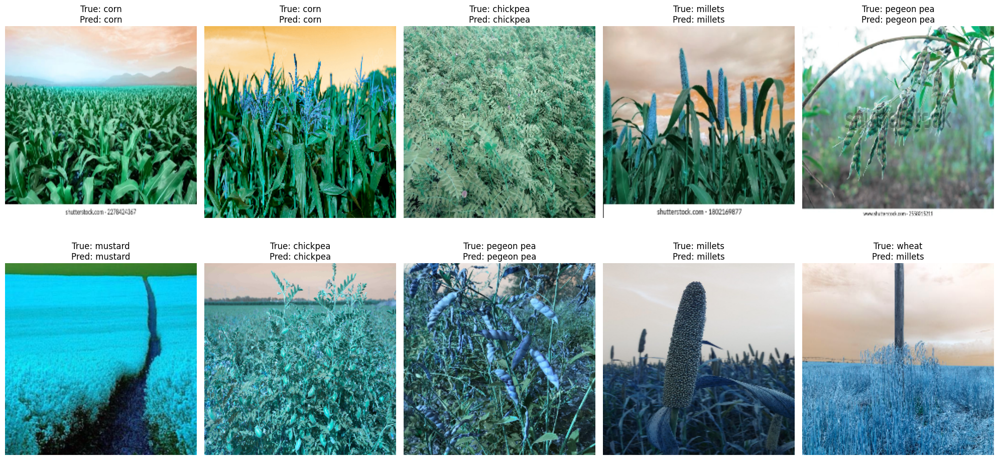

Finished displaying predictions.


In [ ]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Assuming SiftImageDataset and TwoStreamSIFTNet classes are defined in previous cells
# Assuming PROCESSED_DATA_DIR and DEVICE are defined in previous cells
# Assuming best_model_path is defined in previous cells

# --- Load the best model ---
print("Loading the best model...")
num_classes = len(SiftImageDataset(data_dir=PROCESSED_DATA_DIR / "test").classes) # Get number of classes from the test dataset
model = TwoStreamSIFTNet(num_classes=num_classes).to(DEVICE)
model.load_state_dict(torch.load("best_model.pth"))
model.eval()
print("Model loaded successfully.")

# --- Load the test dataset and dataloader ---
print("Loading the test dataset...")
test_dataset = SiftImageDataset(data_dir=PROCESSED_DATA_DIR / "test")
test_loader = DataLoader(test_dataset, batch_size=10, shuffle=True, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)
print("Test dataset loaded.")

# --- Get a batch of images and make predictions ---
print("Getting a batch of images and making predictions...")
images_rgb, images_sift, labels = next(iter(test_loader))
images_rgb, images_sift, labels = images_rgb.to(DEVICE), images_sift.to(DEVICE), labels.to(DEVICE)

with torch.no_grad():
    with torch.cuda.amp.autocast(enabled=(DEVICE == "cuda")):
        outputs = model(images_rgb, images_sift)
    _, predictions = outputs.max(1)

# --- Display images with true and predicted labels ---
print("Displaying images with true and predicted labels...")

# Get class names
class_names = test_dataset.classes

plt.figure(figsize=(20, 10))
for i in range(images_rgb.size(0)):
    plt.subplot(2, 5, i + 1)
    # Convert from CHW to HWC and move to CPU for displaying
    img_display = images_rgb[i].permute(1, 2, 0).cpu().numpy()
    plt.imshow(img_display)

    true_label = class_names[labels[i].item()]
    predicted_label = class_names[predictions[i].item()]

    plt.title(f"True: {true_label}\nPred: {predicted_label}")
    plt.axis('off')

plt.tight_layout()
plt.show()

print("Finished displaying predictions.")

Loading the best model for evaluation...
 -> Model loaded successfully.
 -> Found 9 classes: ['black gram', 'chickpea', 'corn', 'groundnut', 'millets', 'mustard', 'pegeon pea', 'soyabean', 'wheat']

Running evaluation on the test set...


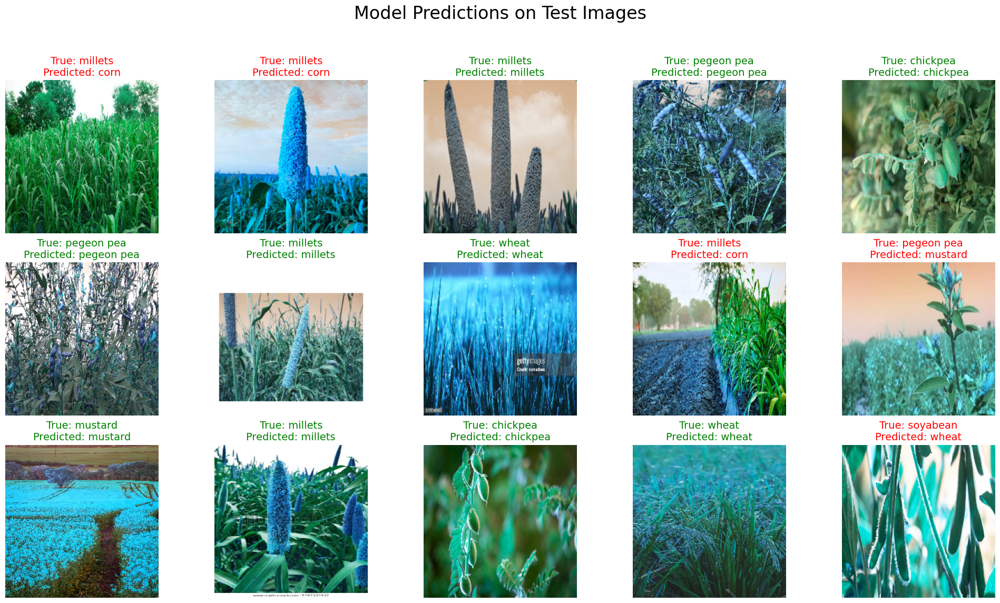


✅ Final Test Accuracy: 73.96% (125/169 correct)


In [ ]:
# -----------------------------------------------------------
# FINAL CELL: VISUAL TESTING ON THE TEST SET
# -----------------------------------------------------------
import matplotlib.pyplot as plt
import random

# --- 1. CONFIGURATION ---
# The number of random images you want to display from the test set
NUM_IMAGES_TO_DISPLAY = 15

# --- 2. LOAD THE BEST MODEL ---
print("Loading the best model for evaluation...")
# Infer the number of classes from the directory structure
num_classes = len(os.listdir(PROCESSED_DATA_DIR / "train"))
model = TwoStreamSIFTNet(num_classes=num_classes).to(DEVICE)
model.load_state_dict(torch.load("best_model.pth"))
model.eval() # Set the model to evaluation mode
print(" -> Model loaded successfully.")

# --- 3. PREPARE THE TEST DATA LOADER ---
# We use a batch size of 1 to easily process images one by one for display
test_dataset = SiftImageDataset(data_dir=PROCESSED_DATA_DIR / "test")
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=True) # Shuffle to get random images

# Get the actual class names
class_names = test_dataset.classes
print(f" -> Found {len(class_names)} classes: {class_names}")

# --- 4. EVALUATE AND VISUALIZE ---
print("\nRunning evaluation on the test set...")
total_correct = 0
total_samples = 0
images_to_show = []
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(20, 12))
plt.suptitle("Model Predictions on Test Images", fontsize=24)

with torch.no_grad():
    for i, (rgb, sift, label) in enumerate(test_loader):
        # Move data to the GPU
        rgb, sift, label = rgb.to(DEVICE), sift.to(DEVICE), label.to(DEVICE)

        # Get model prediction
        output = model(rgb, sift)
        _, prediction = output.max(1)

        # --- Accumulate accuracy ---
        total_samples += 1
        if prediction == label:
            total_correct += 1

        # --- Store images for visualization ---
        if len(images_to_show) < NUM_IMAGES_TO_DISPLAY:
            # Prepare image for plotting: move to CPU, convert format, and un-normalize
            img_display = rgb.squeeze(0).cpu().permute(1, 2, 0).numpy()
            img_display = (img_display * 255).astype(np.uint8)

            true_label = class_names[label.item()]
            pred_label = class_names[prediction.item()]

            images_to_show.append({
                "image": img_display,
                "true_label": true_label,
                "pred_label": pred_label
            })

        # Once we have enough images to show and have processed the whole dataset, stop
        if i + 1 >= len(test_loader):
             break

# --- 5. DISPLAY THE IMAGES AND RESULTS ---
for i, item in enumerate(images_to_show):
    ax = axes.flatten()[i]
    ax.imshow(item["image"])
    ax.axis('off')

    # Set title color based on correctness
    title_color = "green" if item["true_label"] == item["pred_label"] else "red"

    ax.set_title(f"True: {item['true_label']}\nPredicted: {item['pred_label']}",
                 color=title_color, fontsize=14)

# Hide any unused subplots
for j in range(len(images_to_show), len(axes.flatten())):
    axes.flatten()[j].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# --- 6. PRINT FINAL ACCURACY ---
test_acc = (total_correct / total_samples) * 100
print(f"\n=======================================================")
print(f"✅ Final Test Accuracy: {test_acc:.2f}% ({total_correct}/{total_samples} correct)")
print(f"=======================================================")

Loading the best model for evaluation...
 -> Model loaded successfully.
 -> Evaluating on 169 test images across 9 classes...


Evaluating and Saving All Test Images: 100%|██████████| 169/169 [00:15<00:00, 10.87it/s]



✅ Final Test Accuracy: 73.96% (125/169 correct)
 -> All annotated test images have been saved to the 'test_results' directory.

Displaying a random sample of 50 images from the test set...


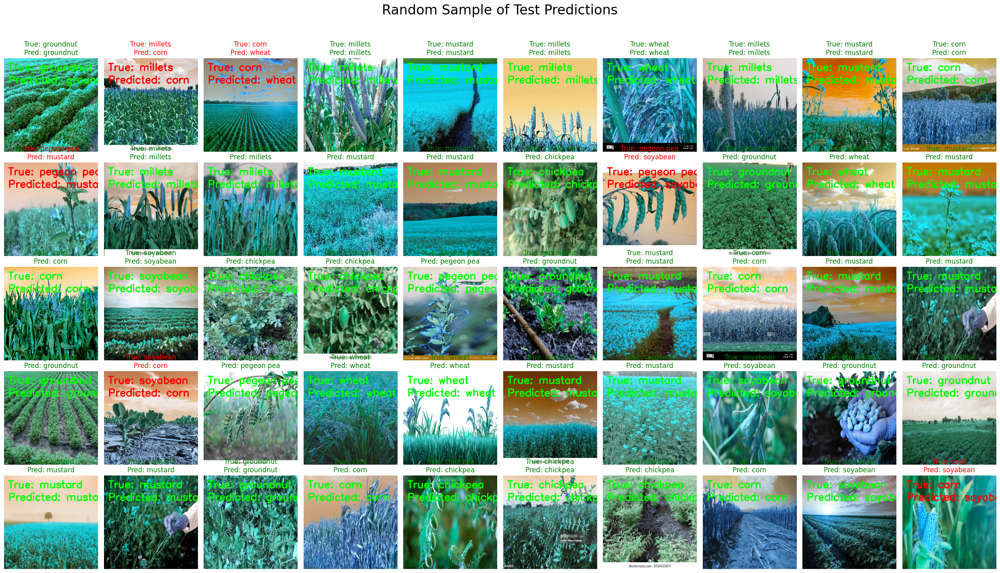

In [ ]:
# ----------------------------------------------------------------------
# FINAL CELL: COMPREHENSIVE TESTING & VISUALIZATION SUITE
# ----------------------------------------------------------------------
import matplotlib.pyplot as plt
import random
import cv2
import shutil

# --- 1. CONFIGURATION ---
# The number of random images to display in the notebook output
NUM_IMAGES_TO_DISPLAY = 50

# The directory where all annotated test images will be saved
OUTPUT_DIR = Path("test_results")

# --- Setup Output Directories ---
if OUTPUT_DIR.exists():
    shutil.rmtree(OUTPUT_DIR)
CORRECT_DIR = OUTPUT_DIR / "correct"
INCORRECT_DIR = OUTPUT_DIR / "incorrect"
CORRECT_DIR.mkdir(parents=True, exist_ok=True)
INCORRECT_DIR.mkdir(parents=True, exist_ok=True)

# --- 2. LOAD THE BEST MODEL ---
print("Loading the best model for evaluation...")
num_classes = len(os.listdir(PROCESSED_DATA_DIR / "train"))
model = TwoStreamSIFTNet(num_classes=num_classes).to(DEVICE)
model.load_state_dict(torch.load("best_model.pth"))
model.eval()
print(" -> Model loaded successfully.")

# --- 3. PREPARE THE TEST DATA LOADER ---
# shuffle=False for the main evaluation ensures we process in a deterministic order
test_dataset = SiftImageDataset(data_dir=PROCESSED_DATA_DIR / "test")
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

class_names = test_dataset.classes
print(f" -> Evaluating on {len(test_dataset)} test images across {len(class_names)} classes...")

# --- 4. PART A: EVALUATE & SAVE EVERY IMAGE ---
# This loop calculates the definitive accuracy and saves all results.
total_correct = 0
total_samples = 0
results_for_display = []

with torch.no_grad():
    for i, (rgb, sift, label) in enumerate(tqdm(test_loader, desc="Evaluating and Saving All Test Images")):
        rgb, sift, label = rgb.to(DEVICE), sift.to(DEVICE), label.to(DEVICE)
        output = model(rgb, sift)
        _, prediction = output.max(1)

        total_samples += 1
        is_correct = (prediction == label).item()
        if is_correct:
            total_correct += 1

        # --- Prepare image for saving and display ---
        img_display = rgb.squeeze(0).cpu().permute(1, 2, 0).numpy()
        img_display = (img_display * 255).astype(np.uint8)
        img_bgr = cv2.cvtColor(img_display, cv2.COLOR_RGB2BGR)

        true_label = class_names[label.item()]
        pred_label = class_names[prediction.item()]

        # Add text labels to the image
        text_color = (0, 255, 0) if is_correct else (0, 0, 255)
        cv2.putText(img_bgr, f"True: {true_label}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, text_color, 2)
        cv2.putText(img_bgr, f"Predicted: {pred_label}", (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.8, text_color, 2)

        # Save the annotated image
        save_path = CORRECT_DIR if is_correct else INCORRECT_DIR
        original_filename = test_dataset.image_files[i].stem.replace('_rgb','')
        cv2.imwrite(str(save_path / f"{original_filename}.jpg"), img_bgr)

        # Store results for random sampling later
        results_for_display.append({
            "image": cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB), # Convert back to RGB for matplotlib
            "true_label": true_label,
            "pred_label": pred_label
        })

# --- 5. PRINT FINAL ACCURACY ---
test_acc = (total_correct / total_samples) * 100
print(f"\n=======================================================")
print(f"✅ Final Test Accuracy: {test_acc:.2f}% ({total_correct}/{total_samples} correct)")
print(f" -> All annotated test images have been saved to the '{OUTPUT_DIR}' directory.")
print(f"=======================================================")

# --- 6. PART B: DISPLAY A RANDOM SAMPLE OF 50 IMAGES ---
print(f"\nDisplaying a random sample of {NUM_IMAGES_TO_DISPLAY} images from the test set...")

# Create a grid for displaying images
# Adjust nrows and ncols for the desired grid size
nrows, ncols = 5, 10
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(25, 15))
plt.suptitle("Random Sample of Test Predictions", fontsize=24)

# Get a random sample from all the results
display_sample = random.sample(results_for_display, min(len(results_for_display), NUM_IMAGES_TO_DISPLAY))

for i, item in enumerate(display_sample):
    ax = axes.flatten()[i]
    ax.imshow(item["image"])
    ax.axis('off')

    title_color = "green" if item["true_label"] == item["pred_label"] else "red"

    ax.set_title(f"True: {item['true_label']}\nPred: {item['pred_label']}",
                 color=title_color, fontsize=12)

# Hide any unused subplots
for j in range(len(display_sample), nrows * ncols):
    axes.flatten()[j].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()